Sign Language Classification by signlish

In [49]:
pip install split-folders

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [50]:
pip install --upgrade keras

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [51]:
pip install --upgrade tensorflow

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [52]:
#การติดตั้งและเรียกใช้งานไลบรารี (import libraries)
import os 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import splitfolders
import tensorflow
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.callbacks import EarlyStopping,ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing import image

 Data Extraction

In [53]:
# path ที่ใช้เก็บข้อมูล
base_path = "D:\mymodel\dataset"

# สร้าง dictionary เพื่อเก็บ 26 คลาส (ตัวอักษร a-z) และหมายเลขคลาส
categories = {  0: "a",
                1: "b",
                2: "c",
                3: "d",
                4: "e",
                5: "f",
                6: "g",
                7: "h",
                8: "i",
                9: "j",
                10: "k",
                11: "l",
                12: "m",
                13: "n",
                14: "o",
                15: "p",
                16: "q",
                17: "r",
                18: "s",
                19: "t",
                20: "u",
                21: "v",
                22: "w",
                23: "x",
                24: "y",
                25: "z",
            }

# ฟังก์ชันเพิ่มคำนำหน้าให้กับคลาส ช่วยเพิ่มความจำเพาะใน column
def add_class_name_prefix(df, col_name):
    df[col_name]
    return df

# สร้างลิสต์เพื่อเก็บชื่อไฟล์ทั้งหมดใน dataset
filenames_list = []
# สร้างลิสต์เพื่อเก็บคลาสที่สอดคล้องกัน แต่ละโฟลเดอร์ของ dataset มีคลาสข้อมูลเพียงคลาสเดียว
categories_list = []

# วนลูปแต่ละคลาสและเชื่อมต่อกับโฟลเดอร์ของคลาสนั้น
for category in categories:
    folder_path = os.path.join(base_path, categories[category])  # ใช้ os.path.join เพื่อเชื่อมเส้นทางอย่างถูกต้อง
    if os.path.exists(folder_path):  # ตรวจสอบว่าโฟลเดอร์นั้นมีอยู่จริงหรือไม่
        filenames = os.listdir(folder_path)  # ดึงรายชื่อไฟล์ทั้งหมดในโฟลเดอร์
        filenames_list += filenames  # เพิ่มรายชื่อไฟล์ไปยังลิสต์ filenames_list
        categories_list += [category] * len(filenames)  # เพิ่มคลาสของแต่ละไฟล์ไปยังลิสต์ categories_list
    else:
        print(f"Folder not found: {folder_path}")  # แจ้งเตือนหากไม่พบโฟลเดอร์

# สร้าง DataFrame ที่มีข้อมูลชื่อไฟล์และคลาสที่สอดคล้องกัน
df = pd.DataFrame({"filename": filenames_list, "category": categories_list})
df = add_class_name_prefix(df, "filename")

# สุ่ม DataFrame เพื่อให้ข้อมูลไม่เรียงตามลำดับคลาสและ reset index
df = df.sample(frac=1).reset_index(drop=True)


In [54]:
#DataFrame ที่เก็บข้อมูลของ dataset โดยมีคอลัมน์ filename และ category
df

,filename,category
0,I22.jpg,8
1,W125.jpg,22
2,I69.jpg,8
3,E41.jpg,4
4,J92.jpg,9
...,...,...
3375,K15.jpg,10
3376,C65.jpg,2
3377,L65.jpg,11
3378,F39.jpg,5


In [55]:
#แสดงจำนวนแถวหรือจำนวนตัวอย่างทั้งหมดใน DataFrame
print("number of elements = ", len(df))

number of elements =  3380


Data Exploration 

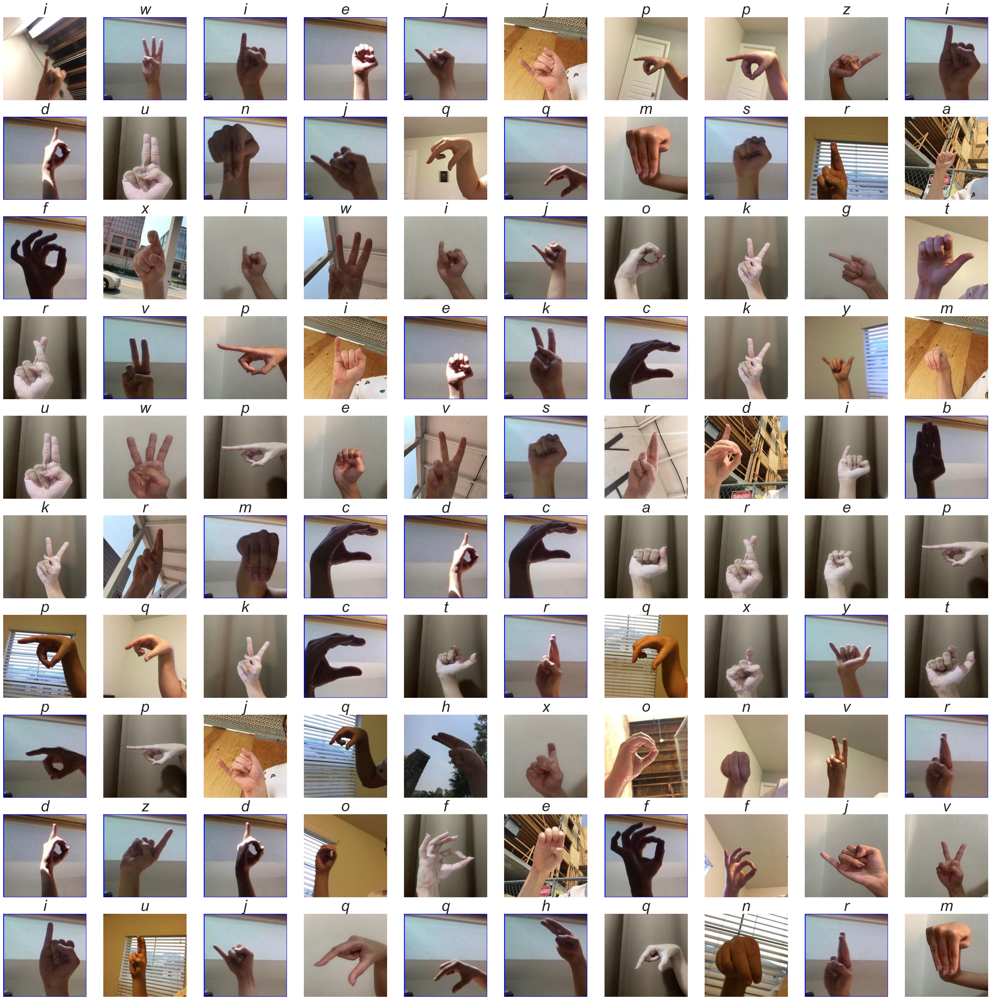

In [56]:
plt.figure(figsize=(40,40))  # สร้างกรอบภาพขนาดใหญ่ 40x40 สำหรับแสดงภาพทั้งหมด

for i in range(100):  # วนลูปเพื่อแสดง 100 ภาพตัวอย่างแรก
    path = os.path.join(base_path, categories[df.category[i]], df.filename[i])  # รวม path
    img = plt.imread(path)  # อ่านภาพจาก path ที่ระบุ
    plt.subplot(10,10, i + 1)  # แบ่งพื้นที่แสดงผลในกริด 10x10
    plt.imshow(img)  
    plt.title(categories[df.category[i]], fontsize=35, fontstyle='italic')  # ตั้งชื่อคลาสบนภาพด้วยฟอนต์ขนาด 35 และรูปแบบ italic
    plt.axis("off")  # ปิดแกนรอบภาพ

C:\Users\Acer\AppData\Local\Temp\ipykernel_21124\1996461522.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=uni, x=uni.index, y='Count', palette='icefire').set_title('Class distribution in Dataset', fontsize=15)  # แสดงกราฟ bar ของการกระจายคลาสด้วยสี icefire


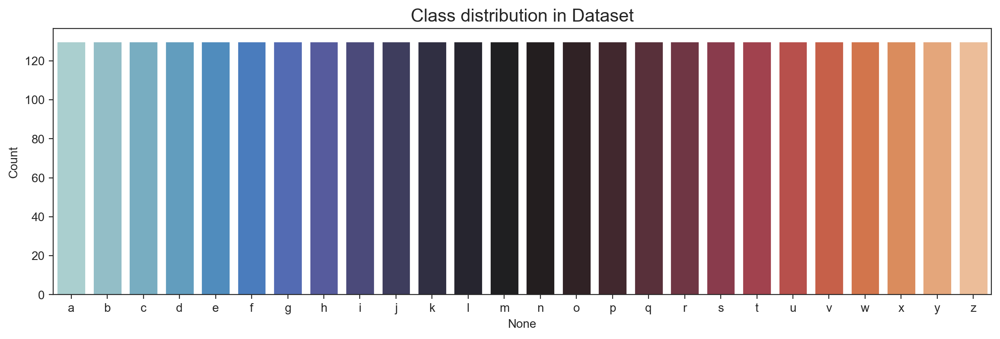

In [57]:
label, count = np.unique(df.category, return_counts=True)  # คำนวณจำนวนของแต่ละคลาสใน df และจัดเก็บในตัวแปร label, count
uni = pd.DataFrame(data=count, index=categories.values(), columns=['Count'])  # สร้าง DataFrame ใหม่สำหรับนับจำนวนคลาส
plt.figure(figsize=(14,4), dpi=200)  # กำหนดขนาดของกราฟเป็น 14x4 และความละเอียดที่ 200 dpi
sns.barplot(data=uni, x=uni.index, y='Count', palette='icefire').set_title('Class distribution in Dataset', fontsize=15)  # แสดงกราฟ bar ของการกระจายคลาสด้วยสี icefire 
plt.show()  # แสดงกราฟ


Train Test Split

In [58]:
# # แบ่งข้อมูลในโฟลเดอร์ 'dataset' ออกเป็น 3 ส่วน คือ train 80%, val 10%, และ test 10% โดยใช้ seed 1333 เพื่อความคงที่
#splitfolders.ratio('D:\mymodel\dataset', output="D:\mymodel\split", seed=1333, ratio=(0.8,0.1,0.1))

Data Preparation

In [59]:
# เส้นทางไปยังโฟลเดอร์
train_path = 'D:\\mymodel\\split\\train'  
val_path = 'D:\\mymodel\\split\\val'      
test_path = 'D:\\mymodel\\split\\test'    
batch = 32            # ขนาดของแบตช์ (batch size) ที่จะใช้ในการฝึกโมเดล
img_size = 200       # ขนาดของภาพที่นำเข้า (input image size)
img_channel = 3      # จำนวนช่องสี (color channels), 3 สำหรับภาพ RGB
n_classes = 26       # จำนวนคลาสที่ต้องจำแนก (classes)


Flow from Directory

In [60]:
# ทำ Augmentation สำหรับการฝึกข้อมูล
# Augmentation จะช่วยเพิ่มความหลากหลายให้กับข้อมูลที่ใช้ในการฝึก โดยการสร้างรูปแบบใหม่จากรูปภาพเดิม
def aug_default():
    return ImageDataGenerator(
        rescale=1.0 / 255,  # ปรับสเกลค่าพิกเซลให้เป็น 0-1
        rotation_range=10,  # หมุนภาพในช่วง 10 องศา
        width_shift_range=0.1,  # เลื่อนภาพในแนวนอน 10%
        height_shift_range=0.1,  # เลื่อนภาพในแนวตั้ง 10%
        shear_range=0.1,  # บิดภาพ 10%
        zoom_range=0.1,  # ซูมเข้าออก 10%
        horizontal_flip=True,  # พลิกภาพในแนวนอน
        fill_mode='nearest'  # กรอกพื้นที่ว่างด้วยค่าที่ใกล้เคียงที่สุด
    )
 # การทำ Augmentation สำหรับคลาสพิเศษ เนื่องจากมีลักษณะของมือที่คล้ายกัน
def get_aug(class_index):
    # สำหรับคลาส a (0), e (4) และ s (18)
    if class_index in [0, 4, 18]:
        return ImageDataGenerator(
            rescale=1.0 / 255,
            rotation_range=20,  # หมุนภาพในช่วง 20 องศา
            width_shift_range=0.25,  # เลื่อนภาพในแนวนอน 25%
            height_shift_range=0.25,  # เลื่อนภาพในแนวตั้ง 25%
            shear_range=0.2,  # บิดภาพ 20%
            zoom_range=0.25,  # ซูมเข้าออก 25%
            fill_mode='nearest'  # กรอกพื้นที่ว่างด้วยค่าที่ใกล้เคียงที่สุด
        )
    # สำหรับคลาส n (13) และ m (12)
    elif class_index in [13, 12]:
        return ImageDataGenerator(
            rescale=1.0 / 255,
            rotation_range=15,  # หมุนภาพในช่วง 15 องศา
            width_shift_range=0.25,  # เลื่อนภาพในแนวนอน 25%
            height_shift_range=0.25,  # เลื่อนภาพในแนวตั้ง 25%
            zoom_range=0.4,  # ซูมเข้าออก 40%
            fill_mode='nearest'  # กรอกพื้นที่ว่างด้วยค่าที่ใกล้เคียงที่สุด
        )
    # สำหรับคลาส c (2) และ o (14)
    elif class_index in [2, 14]:
        return ImageDataGenerator(
            rescale=1.0 / 255,
            rotation_range=20,  # หมุนภาพในช่วง 20 องศา
            width_shift_range=0.25,  # เลื่อนภาพในแนวนอน 25%
            height_shift_range=0.25,  # เลื่อนภาพในแนวตั้ง 25%
            zoom_range=0.25,  # ซูมเข้าออก 25%
            fill_mode='nearest'  # กรอกพื้นที่ว่างด้วยค่าที่ใกล้เคียงที่สุด
        )
    # สำหรับคลาส v (21) และ u (20)
    elif class_index in [21, 20]:
        return ImageDataGenerator(
            rescale=1.0 / 255,
            rotation_range=15,  # หมุนภาพในช่วง 15 องศา
            width_shift_range=0.25,  # เลื่อนภาพในแนวนอน 25%
            height_shift_range=0.25,  # เลื่อนภาพในแนวตั้ง 25%
            zoom_range=0.25,  # ซูมเข้าออก 25%
            fill_mode='nearest'  # กรอกพื้นที่ว่างด้วยค่าที่ใกล้เคียงที่สุด
        )
    # สำหรับคลาส v (21) และ k (10)
    elif class_index in [21, 10]:
        return ImageDataGenerator(
            rescale=1.0 / 255,
            rotation_range=15,  # หมุนภาพในช่วง 15 องศา
            width_shift_range=0.2,  # เลื่อนภาพในแนวนอน 20%
            height_shift_range=0.2,  # เลื่อนภาพในแนวตั้ง 20%
            zoom_range=0.2,  # ซูมเข้าออก 20%
            fill_mode='nearest'  # กรอกพื้นที่ว่างด้วยค่าที่ใกล้เคียงที่สุด
        )
    # สำหรับคลาส g (6), p (15) และ Z (25)
    elif class_index in [6, 15, 25]:
        return ImageDataGenerator(
            rescale=1.0 / 255,
            rotation_range=20,  # หมุนภาพในช่วง 20 องศา
            width_shift_range=0.1,  # เลื่อนภาพในแนวนอน 10%
            height_shift_range=0.1,  # เลื่อนภาพในแนวตั้ง 10%
            zoom_range=0.25,  # ซูมเข้าออก 25%
            fill_mode='nearest'  # กรอกพื้นที่ว่างด้วยค่าที่ใกล้เคียงที่สุด
        )
    # สำหรับคลาส k (10) และ v (21) 
    elif class_index in [10, 21]:
        return ImageDataGenerator(
            rescale=1.0 / 255,
            rotation_range=20,  # หมุนภาพในช่วง 20 องศา
            width_shift_range=0.1,  # เลื่อนภาพในแนวนอน 10%
            height_shift_range=0.1,  # เลื่อนภาพในแนวตั้ง 10%
            zoom_range=0.25,  # ซูมเข้าออก 25%
            fill_mode='nearest'  # กรอกพื้นที่ว่างด้วยค่าที่ใกล้เคียงที่สุด
        )
    else:
        return aug_default()  # ใช้ Augmentation ปกติสำหรับคลาสอื่น ๆ

# โหลดข้อมูลการฝึกโดยการใช้ Augmentation ที่แตกต่างกัน
def load_train_data(train_path, img_size, batch):
    data_gen = ImageDataGenerator(rescale=1.0 / 255)  # สร้าง ImageDataGenerator สำหรับข้อมูลฝึก
    train_data = data_gen.flow_from_directory(
        directory=train_path,  # เส้นทางไปยังโฟลเดอร์ข้อมูลฝึก
        target_size=(img_size, img_size),  # ขนาดของภาพที่ต้องการ
        batch_size=batch,  # ขนาดของแบตช์
        class_mode='categorical'  # โหมดคลาสเป็นประเภทข้อมูลแบบหลายคลาส
    )
    return train_data

# โหลดข้อมูลการฝึก
train_data = load_train_data(train_path, img_size, batch)

# Data augmentation สำหรับ validation และ test (ไม่มีการทำ Augmentation)
val_gen = ImageDataGenerator(rescale=1.0 / 255)  # สร้าง ImageDataGenerator สำหรับข้อมูลตรวจสอบ
val_data = val_gen.flow_from_directory(
    directory=val_path,  # เส้นทางไปยังโฟลเดอร์
    target_size=(img_size, img_size),  # ขนาดของภาพที่ต้องการ
    batch_size=batch,  # ขนาดของแบตช์
    class_mode='categorical'  # โหมดคลาสเป็นประเภทข้อมูลแบบหลายคลาส
)

test_gen = ImageDataGenerator(rescale=1.0 / 255)  # สร้าง ImageDataGenerator สำหรับข้อมูลทดสอบ
test_data = test_gen.flow_from_directory(
    directory=test_path,  # เส้นทางไปยังโฟลเดอร์ข้อมูลทดสอบ
    target_size=(img_size, img_size),  # ขนาดของภาพที่ต้องการ
    batch_size=batch,  # ขนาดของแบตช์
    class_mode='categorical',  # โหมดคลาสเป็นประเภทข้อมูลแบบหลายคลาส
    shuffle=False  # ไม่สุ่มลำดับข้อมูล
)

Found 2715 images belonging to 26 classes.
Found 338 images belonging to 26 classes.
Found 338 images belonging to 26 classes.


Model Layers

In [61]:

# กำหนดโมเดล
model = Sequential()

# Convolution 1
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(200, 200, 3), padding='same'))  # ใช้ฟิลเตอร์ 32 ชุด ขนาด 3x3
model.add(MaxPooling2D((2, 2)))  # ทำ Max Pooling ขนาด 2x2
model.add(BatchNormalization())  # ทำ Batch Normalization

# Convolution 2
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))  # ใช้ฟิลเตอร์ 64 ชุด ขนาด 3x3
model.add(MaxPooling2D((2, 2)))  # ทำ Max Pooling ขนาด 2x2
model.add(BatchNormalization())  # ทำ Batch Normalization

# Convolution 3
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))  # ใช้ฟิลเตอร์ 128 ชุด ขนาด 3x3
model.add(MaxPooling2D((2, 2)))  # ทำ Max Pooling ขนาด 2x2
model.add(BatchNormalization())  # ทำ Batch Normalization

# Convolution 4
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))  # ใช้ฟิลเตอร์ 256 ชุด ขนาด 3x3
model.add(MaxPooling2D((2, 2)))  # ทำ Max Pooling ขนาด 2x2
model.add(BatchNormalization())  # ทำ Batch Normalization

# Convolution 5 
model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))  # ใช้ฟิลเตอร์ 512 ชุด ขนาด 3x3
model.add(MaxPooling2D((2, 2)))  # ทำ Max Pooling ขนาด 2x2
model.add(BatchNormalization())  # ทำ Batch Normalization

# ชั้น Fully Connected
model.add(Flatten())  # แปลงข้อมูลจาก 2D เป็น 1D
model.add(Dense(256, activation='relu'))  # ชั้น Dense แรก มี 256 ยูนิต
model.add(Dropout(0.5))  # เพิ่ม Dropout เพื่อลดการเกิด Overfitting
model.add(Dense(128, activation='relu'))  # ชั้น Dense ที่สอง มี 128 ยูนิต
model.add(Dropout(0.5))  # เพิ่ม Dropout เพื่อลดการเกิด Overfitting

# ชั้น Output
model.add(Dense(26, activation='softmax'))  # ชั้น Output มี 26 ยูนิตสำหรับการจำแนกประเภท


model.summary()  # แสดงข้อมูลสรุปโมเดล


c:\Users\Acer\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 200, 200, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 100, 100, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 100, 100, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 100, 100, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 50, 50, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 50, 50, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 50, 50, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 25, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 25, 25, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 25, 25, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 12, 12, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 12, 12, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 6, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 6, 6, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │     4,718,848 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 26)             │         3,354 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,327,642 (24.14 MB)

 Trainable params: 6,325,658 (24.13 MB)

 Non-trainable params: 1,984 (7.75 KB)

Callbacks

In [62]:
# กำหนด Early Stopping เพื่อตรวจสอบการหยุดการฝึก
early_stopping = EarlyStopping(
    monitor='val_loss',  # ติดตามค่า val_loss
    min_delta=0.001,     # ค่าต่ำสุดที่ต้องการให้เกิดการเปลี่ยนแปลง
    patience=5,          # จำนวน epoch ที่จะรอถ้า val_loss ไม่ดีขึ้น
    restore_best_weights=True,  # คืนค่าหนัก (weights) ที่ดีที่สุด
    verbose=0            # ไม่แสดงข้อความระหว่างการฝึก
)

# กำหนดการลดอัตราการเรียนรู้เมื่อไม่ดีขึ้น
reduce_learning_rate = ReduceLROnPlateau(
    monitor='val_accuracy',  # ติดตามค่า val_accuracy
    patience=2,              # จำนวน epoch ที่จะรอถ้า val_accuracy ไม่ดีขึ้น
    factor=0.5,              # ลดอัตราการเรียนรู้ลง 50%
    verbose=1                # แสดงข้อความเมื่ออัตราการเรียนรู้ถูกลดลง
)


Compile the model

In [63]:
# กำหนด optimization Adam โดยตั้งค่าอัตราการเรียนรู้ที่ 0.0001
opt = Adam(learning_rate=0.0001)

# คอมไพล์โมเดล
model.compile(optimizer=opt,             
              loss='categorical_crossentropy',  # ใช้ฟังก์ชันการสูญเสียแบบ categorical crossentropy สำหรับการจำแนกประเภทหลายคลาส
              metrics=['accuracy'])        # ใช้ accuracy เป็นเมตริกในการประเมินประสิทธิภาพของโมเดล

Fit the model

In [64]:
# ฝึกโมเดลด้วยข้อมูล train_data และการตรวจสอบความถูกต้อง
asl_class = model.fit(
    train_data,                  # ข้อมูลสำหรับการเทรน
    validation_data=val_data,    # ข้อมูลสำหรับการตรวจสอบความถูกต้อง
    epochs=50,                   # จำนวน epoch ที่จะฝึก
    callbacks=[early_stopping, reduce_learning_rate],  # ใช้ callback สำหรับการหยุดฝึกและการลดอัตราการเรียนรู้
    verbose=1                    # แสดงรายละเอียด
)

Epoch 1/50


c:\Users\Acer\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


85/85 ━━━━━━━━━━━━━━━━━━━━ 79s 895ms/step - accuracy: 0.0901 - loss: 4.0538 - val_accuracy: 0.0385 - val_loss: 3.5964 - learning_rate: 1.0000e-04
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 73s 861ms/step - accuracy: 0.2112 - loss: 2.8417 - val_accuracy: 0.0444 - val_loss: 3.6276 - learning_rate: 1.0000e-04
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 75s 881ms/step - accuracy: 0.3086 - loss: 2.4420 - val_accuracy: 0.0621 - val_loss: 3.6660 - learning_rate: 1.0000e-04
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 74s 870ms/step - accuracy: 0.3666 - loss: 2.1488 - val_accuracy: 0.2041 - val_loss: 2.8375 - learning_rate: 1.0000e-04
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 75s 888ms/step - accuracy: 0.4356 - loss: 1.9532 - val_accuracy: 0.6124 - val_loss: 1.6910 - learning_rate: 1.0000e-04
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 75s 878ms/step - accuracy: 0.4716 - loss: 1.7548 - val_accuracy: 0.7959 - val_loss: 1.0612 - learning_rate: 1.0000e-04
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 75s 885ms/step - accuracy: 0.57

Evaluvation

In [65]:
# ประเมินผลโมเดลสำหรับข้อมูลการฝึก
loss,acc = model.evaluate(train_data , verbose = 0) # ประเมินค่า loss และ accuracy สำหรับข้อมูลการฝึก
print('The accuracy of the model for training data is:',acc*100)
print('The Loss of the model for training data is:',loss)


loss,acc = model.evaluate(val_data, verbose = 0) # ประเมินค่า loss และ accuracy สำหรับข้อมูลการตรวจสอบความถูกต้อง
print('The accuracy of the model for validation data is:',acc*100)
print('The Loss of the model for validation data is:',loss)

The accuracy of the model for training data is: 99.96317028999329
The Loss of the model for training data is: 0.01332877017557621
The accuracy of the model for validation data is: 92.30769276618958
The Loss of the model for validation data is: 0.2569635808467865


Plot the results

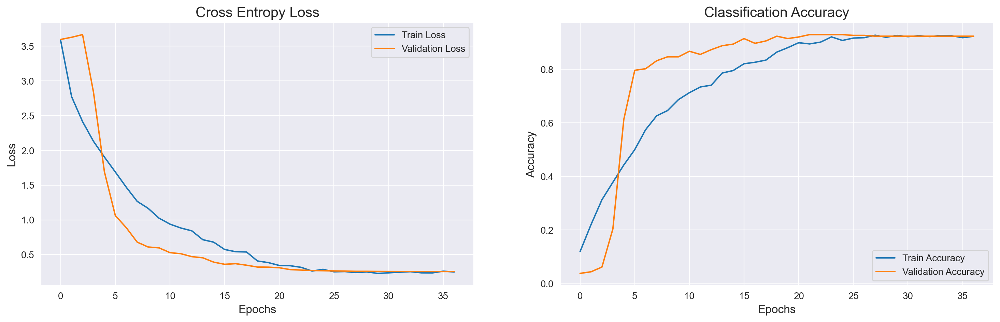

In [66]:
# สร้าง DataFrame สำหรับบันทึกประวัติการฝึก
error = pd.DataFrame(asl_class.history)

# ตั้งค่าขนาดของกราฟ
plt.figure(figsize=(18, 5), dpi=200)
sns.set_style('darkgrid')  # กำหนดสไตล์ของกราฟ

# กราฟสำหรับ Cross Entropy Loss
plt.subplot(121)  # แบ่งกราฟเป็น 1 แถว 2 คอลัมน์ และเลือกกราฟแรก
plt.title('Cross Entropy Loss', fontsize=15)  # ชื่อกราฟ
plt.xlabel('Epochs', fontsize=12)  # ชื่อแกน X
plt.ylabel('Loss', fontsize=12)  # ชื่อแกน Y
plt.plot(error['loss'], label='Train Loss')  # แสดง Loss ของข้อมูลการฝึก
plt.plot(error['val_loss'], label='Validation Loss')  # แสดง Loss ของข้อมูลการตรวจสอบ
plt.legend()  # แสดงคำอธิบายกราฟ

# กราฟสำหรับ Classification Accuracy
plt.subplot(122)  # เลือกกราฟที่สอง
plt.title('Classification Accuracy', fontsize=15)  # ชื่อกราฟ
plt.xlabel('Epochs', fontsize=12)  # ชื่อแกน X
plt.ylabel('Accuracy', fontsize=12)  # ชื่อแกน Y
plt.plot(error['accuracy'], label='Train Accuracy')  # แสดง Accuracy ของข้อมูลการฝึก
plt.plot(error['val_accuracy'], label='Validation Accuracy')  # แสดง Accuracy ของข้อมูลการตรวจสอบ
plt.legend()  # แสดงคำอธิบายกราฟ

# แสดงกราฟ
plt.show()


Prediction

In [67]:
# ทำการพยากรณ์ (prediction) โดยใช้โมเดลที่ฝึกแล้ว
result = model.predict(test_data, verbose=0)  # คำนวณผลลัพธ์จากชุดข้อมูล test

# แปลงค่าที่ได้จากการพยากรณ์ให้เป็นหมวดหมู่ (class) โดยใช้ argmax
y_pred = np.argmax(result, axis=1)

# รับค่าความจริง (true labels) จากชุดข้อมู test
y_true = test_data.labels

# ประเมินผลโมเดล
loss, acc = model.evaluate(test_data, verbose=0)  # คำนวณ loss และ accuracy ของโมเดลในข้อมูล val

# แสดงผลลัพธ์
print('The accuracy of the model for testing data is:', acc * 100)  
print('The Loss of the model for testing data is:', loss) 


The accuracy of the model for testing data is: 93.78698468208313
The Loss of the model for testing data is: 0.25922295451164246


The count of correctly and incorrectly classified images.

In [68]:
# เก็บผลการพยากรณ์และค่าความจริง
p = y_pred  # ผลการพยากรณ์จากโมเดล
y = y_true  # ค่าความจริงจากชุดข้อมูล test

# หาอินเด็กซ์ของการพยากรณ์ที่ถูกต้อง
correct = np.nonzero(p == y)[0]  # ค้นหาอินเด็กซ์ที่การพยากรณ์ตรงกับค่าความจริง

# หาอินเด็กซ์ของการพยากรณ์ที่ไม่ถูกต้อง
incorrect = np.nonzero(p != y)[0]  # ค้นหาอินเด็กซ์ที่การพยากรณ์ไม่ตรงกับค่าความจริง

# แสดงผลจำนวนการพยากรณ์ที่ถูกต้องและไม่ถูกต้อง
print("Correct predicted classes:", correct.shape[0])
print("Incorrect predicted classes:", incorrect.shape[0])


Correct predicted classes: 317
Incorrect predicted classes: 21


Classification report

In [69]:
# แสดงรายงานการจำแนกประเภท (classification report)
print(classification_report(y_true, y_pred,target_names= categories.values()))

              precision    recall  f1-score   support

           a       1.00      0.92      0.96        13
           b       0.87      1.00      0.93        13
           c       0.81      1.00      0.90        13
           d       1.00      1.00      1.00        13
           e       1.00      1.00      1.00        13
           f       1.00      0.85      0.92        13
           g       1.00      0.92      0.96        13
           h       0.93      1.00      0.96        13
           i       0.93      1.00      0.96        13
           j       0.93      1.00      0.96        13
           k       1.00      1.00      1.00        13
           l       0.92      0.92      0.92        13
           m       0.86      0.92      0.89        13
           n       1.00      0.85      0.92        13
           o       1.00      0.92      0.96        13
           p       1.00      1.00      1.00        13
           q       0.93      1.00      0.96        13
           r       0.77    

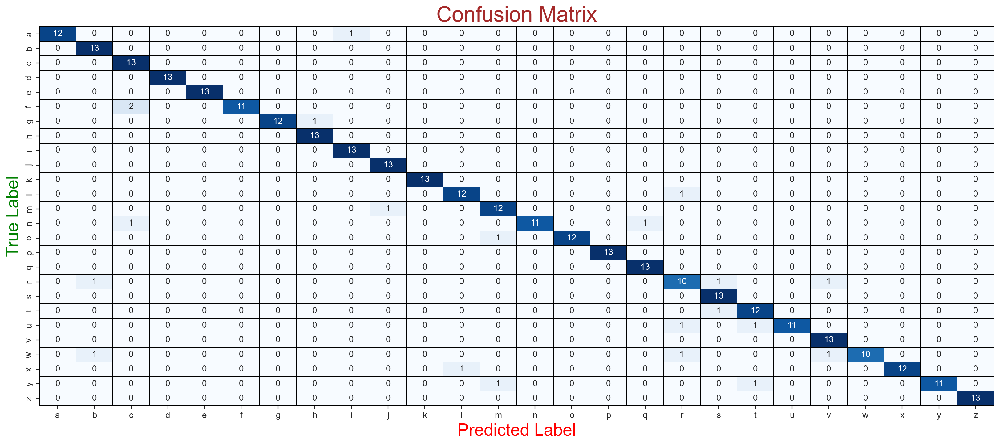

In [70]:
# กำหนดสไตล์กราฟให้มีลักษณะ 'ticks'
sns.set_style('ticks')

# สร้าง confusion matrix โดยใช้ y_true และ y_pred
confusion_mtx = confusion_matrix(y_true, y_pred) 

# กำหนดขนาดและ DPI ของกราฟ
f, ax = plt.subplots(figsize=(20, 8), dpi=200)

# สร้าง heatmap ของ confusion matrix
sns.heatmap(confusion_mtx, annot=True, 
            linewidths=0.1, cmap='Blues',
            linecolor='black', fmt='.0f', ax=ax, 
            cbar=False, xticklabels=categories.values(), 
            yticklabels=categories.values())

# กำหนดชื่อแกน x และ y พร้อมการปรับสีและขนาด
plt.xlabel("Predicted Label", fontdict={'color': 'red', 'size': 20})
plt.ylabel("True Label", fontdict={'color': 'green', 'size': 20})

# กำหนดชื่อกราฟ
plt.title("Confusion Matrix", fontdict={'color': 'brown', 'size': 25})

# แสดงกราฟ
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


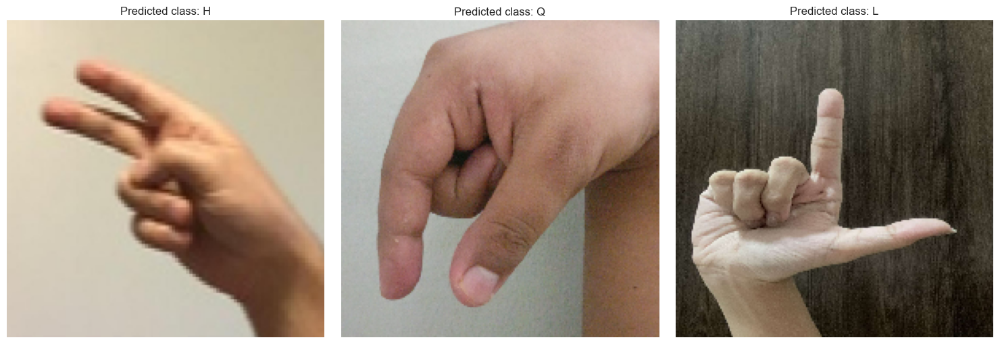

In [93]:
# ตัวอย่างรูปที่โมเดลไม่อยู่ใน dataset แต่นำมาทดสอบการ predict
# ฟังก์ชันเพื่อโหลดและเตรียมรูปภาพ
def load_and_preprocess_images(img_paths, img_size):
    images = []
    original_images = []
    for img_path in img_paths:
        # โหลดรูปภาพ
        img = image.load_img(img_path, target_size=(img_size, img_size))
        # แปลงรูปภาพเป็น array
        img_array = image.img_to_array(img)
        # เพิ่มมิติให้กับ array เพื่อให้เป็น (1, img_size, img_size, 3)
        img_array = np.expand_dims(img_array, axis=0)
        # Normalization
        img_array /= 255.0
        images.append(img_array)
        original_images.append(img)  # เก็บภาพดั้งเดิม
    return np.vstack(images), original_images  # คืนค่ารูปภาพ array และรูปภาพดั้งเดิม

# ตัวอย่างการใช้
img_paths = [
    'D:/mymodel/hand_test/H.png',  # path รูปภาพที่ต้องการ predict
    'D:/mymodel/hand_test/Q.png',
    'D:/mymodel/hand_test/L.jpg'
]
img_size = 200  # ขนาดที่ใช้สำหรับโมเดล

# โหลดและเตรียมรูปภาพ
prepared_images, original_images = load_and_preprocess_images(img_paths, img_size)

# ทำการ predict
predictions = model.predict(prepared_images)

# แปลง predicted_classes เป็นตัวอักษร
predicted_classes = np.argmax(predictions, axis=1)
class_mapping = {i: chr(65 + i) for i in range(26)}  # A-Z: 65 เป็น ASCII ของ A
predicted_letters = [class_mapping[predicted_class] for predicted_class in predicted_classes]

# แสดงผลลัพธ์ในรูปแบบแนวนอน
num_images = len(original_images)
plt.figure(figsize=(5 * num_images, 5))  # ปรับขนาดรูปภาพตามจำนวนรูป

for i in range(num_images):
    plt.subplot(1, num_images, i + 1)  # แบ่งรูปภาพในแนวนอน
    plt.imshow(original_images[i])
    plt.axis('off')
    plt.title(f"Predicted class: {predicted_letters[i]}")

plt.tight_layout()  # ปรับระยะห่างให้พอดี
plt.show()

In [72]:
model.save('mymodel_asl1.h5')